<a href="https://colab.research.google.com/github/IliaKipshidze/BuiltIn-Random-Generator-Tests-/blob/main/random_generator_testings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Ilia Kipshidze**



---




#**Imports**

In [ ]:
#@title
import random
import scipy.stats
import time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatch
import pandas as pd

# **პირველი ტესტი**

In [ ]:
#@title
def I_test(n, k, alpha, fileName):

    randsFile = open(fileName, 'r')
    interval_len = 1/k

    f = [0 for _ in range(0, k+1)]     #სიხშირეების შესანახი მასივი (ვქმნი ერთი ელემენტით დიდს რომ ინდექსირება არაპროგრამისტულად, 1-დან დაიწყოს)
    for gama_i in range(0, n):
        # rand_num = random.uniform(0, 1)
        rand_num = float(randsFile.readline())
        j = int(rand_num//interval_len) + 1
        if rand_num//interval_len == rand_num/interval_len:
          j-=1
        try:
          f[j] = f[j] + 1
        except:
          print(j)
        # for j in range(1, k+1):        #გადავუვლით ინტერვალებს
        #     if rand_num <= j*interval_len:     #და ვამოწმებთ რომელში ჩავარდა ჩვენი რენდომ რიცხვი
        #         f[j] = f[j] + 1
        #         break
    randsFile.close()
    sum = 0
    for j in range(1, k+1):
        sum += (f[j]-(n/k))**2
    Xi = k*sum/n

    z_alpha = scipy.stats.norm.ppf(1-alpha)
    Xi_original = (k-1)*(1 - 2 / (9 * (k-1)) + z_alpha * (2 / (9 * (k-1)))**(1/2))**3

    return Xi <= Xi_original

In [ ]:
0.8//0.2 == 0.8/0.2

True

#**მეორე ტესტი**

In [ ]:
#@title
def II_test(nd, k, d, alpha, fileName):

    randsFile = open(fileName, 'r')

    n = nd//d
    quantity_counter = dict()
    interval_len = 1 / k

    for _ in range(0, n):
        rand_vect = ""
        for _ in range(0, d):
            # rand_num = random.uniform(0, 1)
            rand_num = float(randsFile.readline())
            j = int(rand_num//interval_len) + 1
            if rand_num//interval_len == rand_num/interval_len:
              j-=1
            rand_vect+=str(j)
            rand_vect+="+"
            # for j in range(1, k + 1):  # გადავუვლით ინტერვალებს
            #     if rand_num <= j * interval_len:
            #         rand_vect+=str(j)
            #         rand_vect+="+"
            #         break
        if quantity_counter.get(rand_vect) == None:
            quantity_counter[rand_vect] = 1
        else:
            quantity_counter[rand_vect] += 1
    randsFile.close()
    sum = 0
    for f_jd in quantity_counter.values():
        sum+= (f_jd - n/(k**d))**2
    sum += (k**d - len(quantity_counter)) * ((n/(k**d))**2)
    Xi = sum*(k**d)/n

    z_alpha = scipy.stats.norm.ppf(1 - alpha)
    Xi_original = (k**d - 1) * (1 - 2 / (9 * (k**d - 1)) + z_alpha * (2 / (9 * (k**d - 1))) ** (1 / 2)) ** 3

    return Xi <= Xi_original

#**მესამე ტესტი**

In [ ]:
#@title
def III_test(n, alpha, fileName):

    randsFile = open(fileName, 'r')

    r = [0 for _ in range(0, 6)]

    counter = 1
    prev_rand = float(randsFile.readline())

    for _ in range(0, n-1):
        curr_rand = float(randsFile.readline())

        if curr_rand <= prev_rand:
            if counter >= 6:
                r[5]+=1
            else:
                r[counter-1]+=1
            counter = 1
        else:
            counter += 1
        prev_rand = curr_rand

    if counter >= 6:
        r[5] += 1
    else:
        r[counter-1] += 1

    randsFile.close()

    a = [[4529.4, 9044.9, 13568, 18091, 22615, 27892],
         [9044.9, 18097, 27139, 36187, 45234, 55789],
         [13568, 27139, 40721, 54281, 67852, 83685],
         [18091, 36187, 54281, 72414, 90470, 111580],
         [22615, 45234, 67852, 90470, 113262, 139476],
         [27892, 55789, 83685, 111580, 139476, 172860]]

    b = [1/6, 5/24, 11/120, 19/720, 29/5040, 1/840]

    sum = 0

    for i in range(0, 6):
        for j in range(0, 6):
            sum += a[i][j] * (r[i]- n*b[i]) * (r[j] - n*b[j])

    R = sum/n

    z_alpha = scipy.stats.norm.ppf(1 - alpha)
    Xi_original = 6 * (1 - 2 / (9 * 6) + z_alpha * (2 / (9 * 6)) ** (1 / 2)) ** 3

    return R <= Xi_original

#**მეოთხე ტესტი**

In [ ]:
#@title
def IV_test(n, l, alpha, fileName):

    randsFile = open(fileName, 'r')

    rand_gammas = [float(randsFile.readline()) for _ in range(0, n)]

    randsFile.close()

    for j in range(1, l+1):
        h = (n-1)//j - 1
        sum = 0
        for k in range(0, h+1):
            sum += rand_gammas[k*j] * rand_gammas[(k+1)*j]

        ro_j = 12*sum/(h+1) - 3
        A_j = ro_j*(h+1)/((13*h+7)**(1/2))
        z = scipy.stats.norm.ppf(alpha/2)

        if A_j < z:
            return j
        if j==l:
          return l
    return -1

# Defining visualization functions

#### Dropped spines (showDroppedSpines)
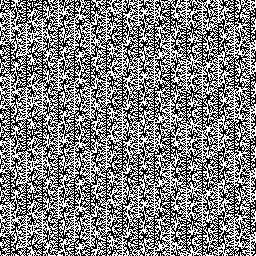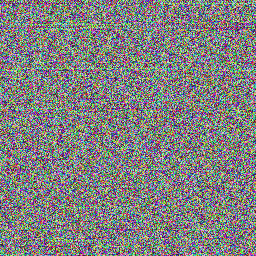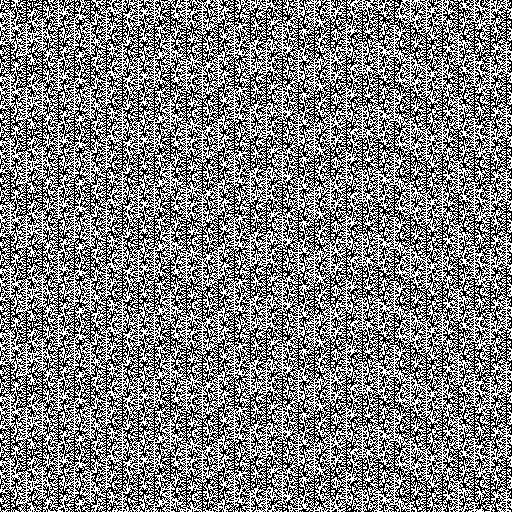

In [ ]:
#@title
def showDroppedSpines(file):
  file_indexes = [(1000000, 1000), (2000000, 1200) , (3000000, 1400), (4000000, 1600), (5000000, 1800)]

  fig, ax = plt.subplots(1, 1, figsize=(60, 10))
  for i in range(0, 1):
    myFile = open(file+"/"+file.split('/')[-1]+"_"+str(file_indexes[i][0])+".txt", 'r')
    image = np.array([[float(myFile.readline()) for _ in range(file_indexes[i][1])] for _ in range(file_indexes[i][1])])


    ax.imshow(image, cmap=plt.cm.gray)
    ax.set_title("n = "+str(file_indexes[i][0]))

    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

  plt.show()


#### Colorbars (showColorbars)

In [ ]:
#@title
def showColorbars(file):
  file_indexes = [(1000000, 1000), (2000000, 1200) , (3000000, 1400), (4000000, 1600), (5000000, 1800)]
  fig, ax = plt.subplots(1, 1, figsize = (60, 10))
  for i in range(1):
    myFile = open(file+"/"+file.split('/')[-1]+"_"+str(file_indexes[i][0])+".txt", 'r')
    image = np.array([[float(myFile.readline()) for _ in range(file_indexes[i][1])] for _ in range(file_indexes[i][1])])

    im = ax.imshow(image)
    ax.set_title("n = "+str(file_indexes[i][0]))

    # fig.colorbar(im, ax=ax[i])
    fig.colorbar(im)


  plt.show()

#### Histograms (showHistograms)

In [ ]:
#@title
def showHistograms(file):
  file_indexes = [(1000000, 1000), (2000000, 1200) , (3000000, 1400), (4000000, 1600), (5000000, 1800)]
  fig, ax = plt.subplots(1, 5, figsize = (30, 5))

  for i in range(5):
    myFile = open(file+"/"+file.split('/')[-1]+"_"+str(file_indexes[i][0])+".txt", 'r')
    rands = np.array([float(myFile.readline()) for _ in range(file_indexes[i][0])])
    ax[i].set_title("n = "+str(file_indexes[i][0]))
    ax[i].hist(rands, bins=100)
  

#### show results of four tests for five samples (showTestResults)


In [ ]:
#@title
def showTestResults(results, sampleParams): 

  fig, ax = plt.subplots(1, 5, figsize = (30, 5))
  for i in range(0, 5):
    I = "I test\n"+str(results[i][0])
    II = "II test\nd = "+str(results[i][1])
    III = "III test\n"+str(results[i][2])
    IV = ""
    if (not results[i][0]) or (not results[i][2]):
      IV = "IV test\nj = "
    else:
      IV = "IV test\nj = "+str(results[i][3])

    I_color = 'r'
    III_color = 'r'
    if results[i][0]:
      I_color = 'g'
    if results[i][2]:
      III_color = 'g'

    rectangles = {I : mpatch.Rectangle((0,4.2), 5, 4, fc=I_color),
                  II : mpatch.Rectangle((5.2,4.2), 5, 4),
                  III : mpatch.Rectangle((0,0), 5, 4, fc=III_color),
                  IV : mpatch.Rectangle((5.2,0), 5, 4)}

    for r in rectangles:
        ax[i].add_artist(rectangles[r])
        rx, ry = rectangles[r].get_xy()
        cx = rx + rectangles[r].get_width()/2.0
        cy = ry + rectangles[r].get_height()/2.0

        ax[i].annotate(r, (cx, cy), color='w', weight='bold', 
                    fontsize=12, ha='center', va='center')

    ax[i].set_xlim((0, 10.2))
    ax[i].set_ylim((0, 8.2))
    ax[i].set_aspect('equal')
    ax[i].set_title("n = "+str(sampleParams[i][0])+", k = "+str(sampleParams[i][1])+", alpha = "+str(sampleParams[i][2]))
    ax[i].tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
  plt.show()

#### show overall results (showOverallResults)

In [ ]:
#@title
def showOverallResults(results, sampleParams):

  # donut charts for I and III tes

  fig, ax = plt.subplots(2, 2, figsize = (20, 10))

  chartRadius = 0.7

  data = [sum([int(arr[0]) for arr in results]), sum([int(not arr[0]) for arr in results])]
  ax[0, 0].pie(data, colors=['#22b573', '#ff1f4a'])
  circle = plt.Circle( (0,0), chartRadius, color='white')
  ax[0, 0].add_artist(circle)
  ax[0, 0].set_title("I test")
  ax[0, 0].text(0, 0, str(data[0])+" / "+str(sum(data))+"\npassed", ha='center', va='center', fontsize=14)

  data = [sum([int(arr[2]) for arr in results]), sum([int(not arr[2]) for arr in results])]
  ax[0, 1].pie(data, colors=['#22b573', '#ff1f4a'])
  circle = plt.Circle((0,0), chartRadius, color='white')
  ax[0, 1].add_artist(circle)
  ax[0, 1].set_title("III test")
  ax[0, 1].text(0, 0, str(data[0])+" / "+str(sum(data))+"\npassed", ha='center', va='center', fontsize=14)


  # j and d visualizer bar chart

  ticks = ["n = "+str(arr[0]) for arr in sampleParams]
  j_s = [arr[3] if (arr[0] and arr[2]) else 0 for arr in results]
  d_s = [arr[1] for arr in results]


  wd = 0.6
  x_pos = np.arange(1, 2*len(ticks), 2, )

  ax[1, 0].bar(x_pos, j_s, color='#FF6133', width=wd,
          label='j')
  ax[1, 1].bar(x_pos, d_s, color='#FF3338', width=wd, 
          label='d')

  for i in range(len(ticks)):
    j_fontsize = d_fontsize = 10
    if j_s[i] == min(j_s):
      j_fontsize = 18
    if d_s[i] == max(d_s):
      d_fontsize = 18
    j_sstr = str(j_s[i])
    if j_s[i] == 0:
      j_sstr = ""
    ax[1, 0].text(x_pos[i], j_s[i] , j_sstr, ha='center', va='bottom', fontsize=j_fontsize)
    ax[1, 1].text(x_pos[i], d_s[i] -0.5, str(d_s[i]), ha='center', va='bottom', fontsize=d_fontsize, c='w')

  ax[1, 0].set_xticks(x_pos)
  ax[1, 0].set_xticklabels(ticks)
  ax[1, 0].set_title('final results for j', fontsize=16)
  ax[1, 0].set_xlabel('samples', fontsize=13)

  ax[1, 1].set_xticks(x_pos)
  ax[1, 1].set_xticklabels(ticks)
  ax[1, 1].set_title('final results for d', fontsize=16)
  ax[1, 1].set_xlabel('samples', fontsize=13)

  plt.show()

# defining testing functions (getTestResultsForFiveSample)

In [ ]:
#@title
def getTestResultsForFiveSample(sampleParams, folderPath):

  results = []

  for sampleparams in sampleParams:
    n = sampleparams[0]
    k = sampleparams[1]
    alpha = sampleparams[2]
    fileName = folderPath+"/"+folderPath.split('/')[-1]+"_"+str(n)+".txt"
    #1st test
    I_res = I_test(n, k, alpha, fileName)
    #2nd test
    II_res = 0
    for i in range(1, 6):
      try:
        k_2 = 8
        while ((n/i)/(k_2**i))>=5:
          k_2+=1
          if k_2>2**17 and n>3000000:
            break
          if k_2>2**16 and n<=3000000:
            break
        k_2-=1
        if II_test(n, k_2, i, alpha, fileName) == False:
          II_res = i-1
          break
      except:
        #როცა დააბრუნებს მინუსიან d ს ეს იმას ნიშნავს რომ აქამდე გამოთვლები შეძლო და True -ს აბრუნებდა, მაგრამ მეტზე ვერ ითვლის
        II_res = -(i-1)
        break
      if i==5:
        II_res = 5
    #3rd test
    III_res = III_test(n, alpha, fileName)
    #4th test
    IV_res = IV_test(n, n-1, alpha, fileName)

    results.append([I_res, II_res, III_res, IV_res])
  
  return results

# testing **python** built-in random generator

#### sample visualization

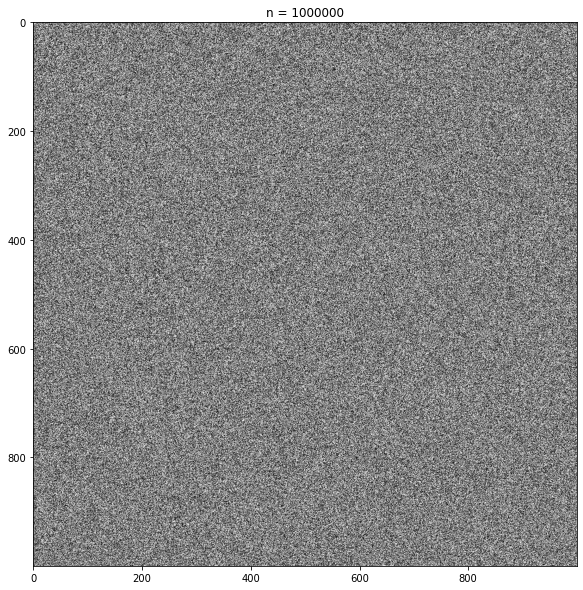

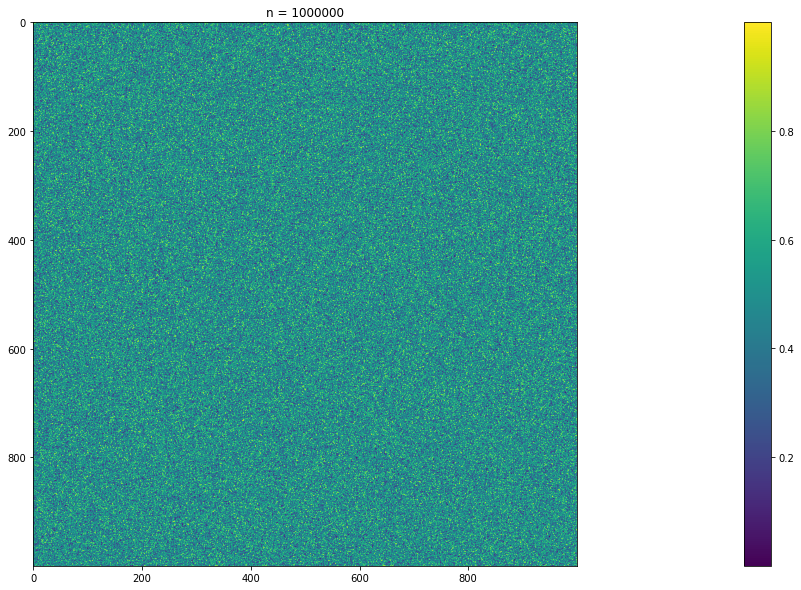

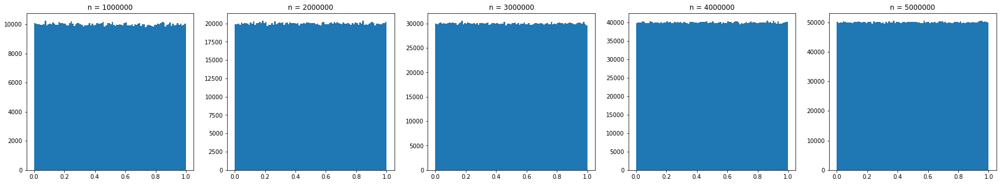

In [ ]:
#@title
showDroppedSpines("/content/drive/MyDrive/Colab Notebooks/random generator tests/pyRands")
showColorbars("/content/drive/MyDrive/Colab Notebooks/random generator tests/pyRands")
showHistograms("/content/drive/MyDrive/Colab Notebooks/random generator tests/pyRands")

#### testing results

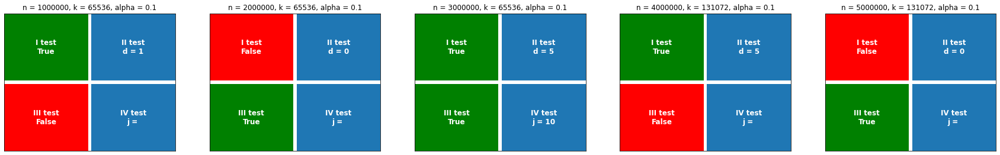

In [ ]:
#@title
sampleParams = [[1000000, 2**16, 0.1],
                  [2000000, 2**16, 0.1],
                  [3000000, 2**16, 0.1],
                  [4000000, 2**17, 0.1],
                  [5000000, 2**17, 0.1]]
pyRes = getTestResultsForFiveSample(sampleParams, "/content/drive/MyDrive/Colab Notebooks/random generator tests/pyRands")
showTestResults(pyRes, sampleParams)


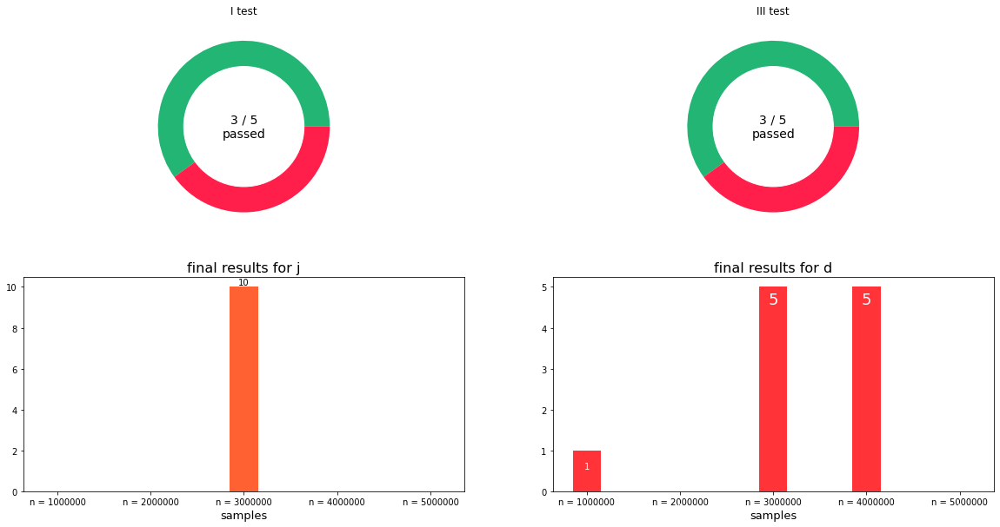

In [ ]:
#@title
showOverallResults(pyRes, sampleParams)

# testing **c++** built-in random generator

####sample visualization

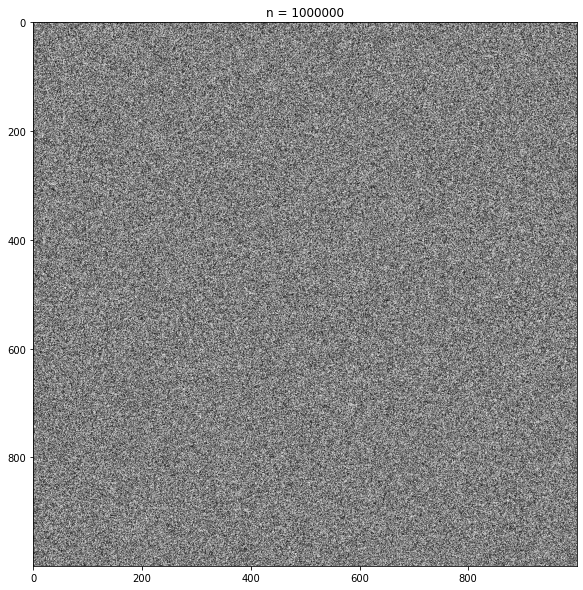

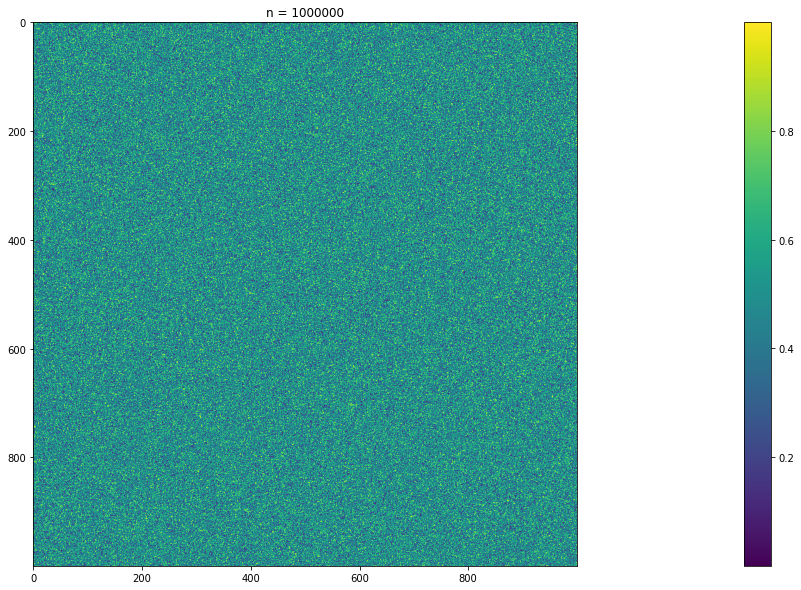

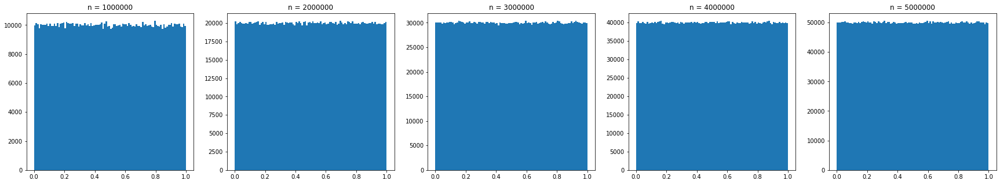

In [ ]:
#@title
showDroppedSpines("/content/drive/MyDrive/Colab Notebooks/random generator tests/cppRands")
showColorbars("/content/drive/MyDrive/Colab Notebooks/random generator tests/cppRands")
showHistograms("/content/drive/MyDrive/Colab Notebooks/random generator tests/cppRands")

####testing results

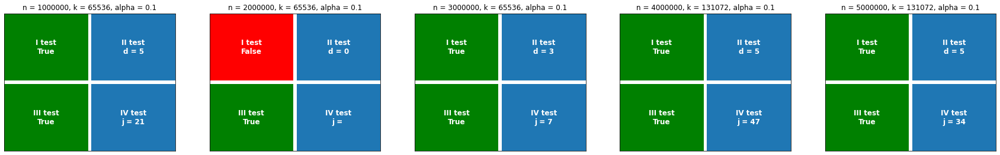

In [ ]:
#@title
sampleParams = [[1000000, 2**16, 0.1],
                  [2000000, 2**16, 0.1],
                  [3000000, 2**16, 0.1],
                  [4000000, 2**17, 0.1],
                  [5000000, 2**17, 0.1]]
cppRes = getTestResultsForFiveSample(sampleParams, "/content/drive/MyDrive/Colab Notebooks/random generator tests/cppRands")
showTestResults(cppRes, sampleParams)

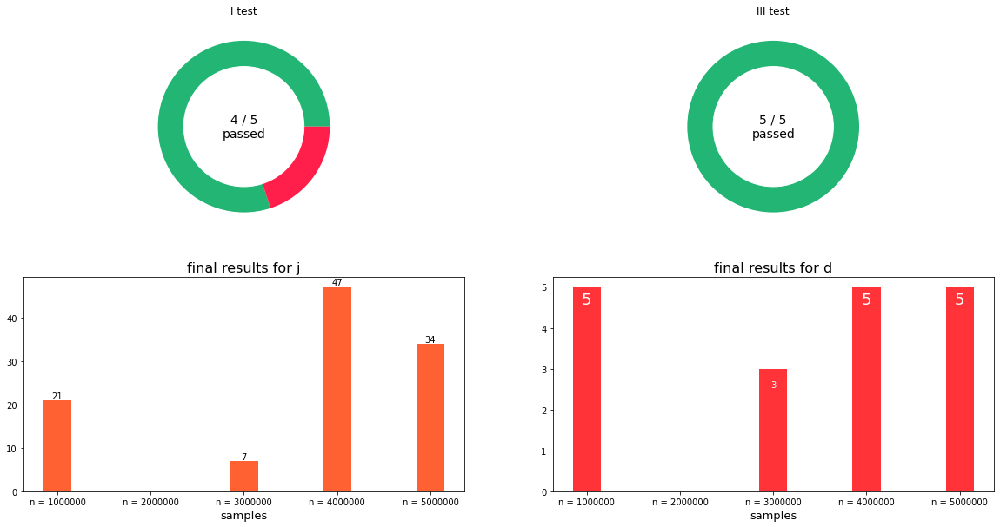

In [ ]:
#@title
showOverallResults(cppRes, sampleParams)

#testing **java** built-in random generator

####sample visualization

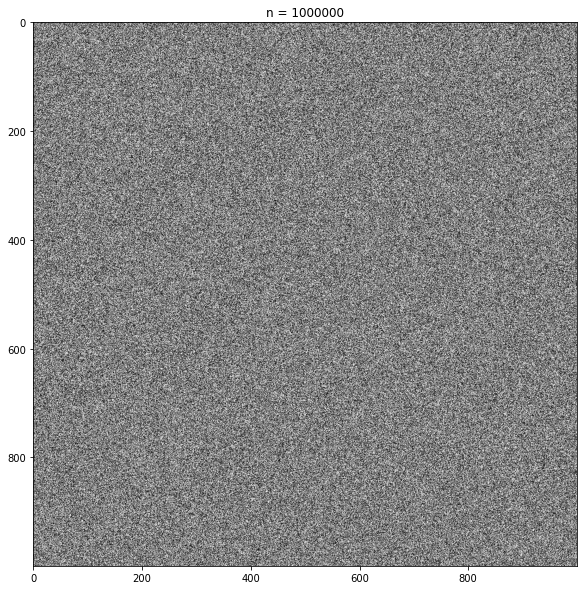

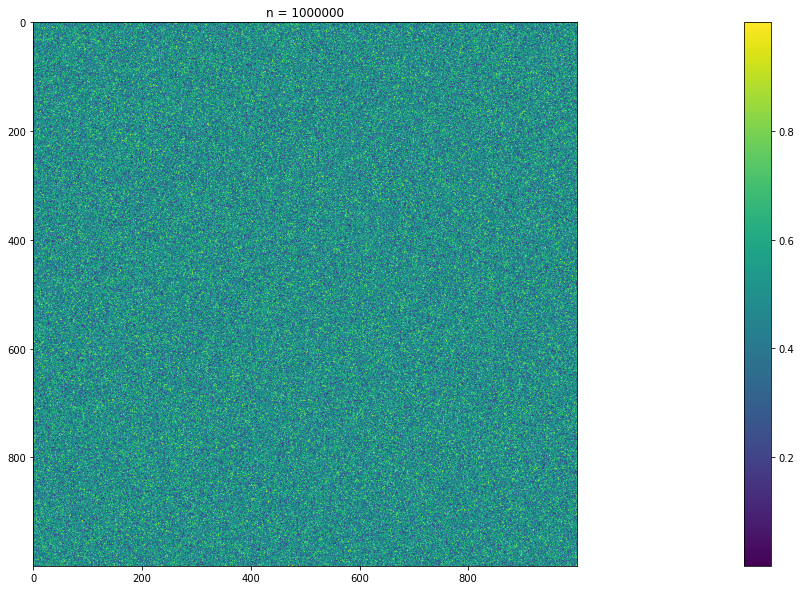

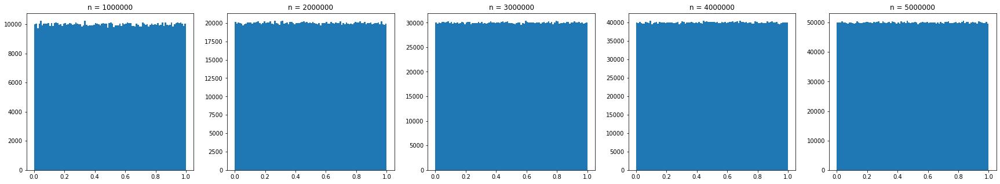

In [ ]:
#@title
showDroppedSpines("/content/drive/MyDrive/Colab Notebooks/random generator tests/javaRands")
showColorbars("/content/drive/MyDrive/Colab Notebooks/random generator tests/javaRands")
showHistograms("/content/drive/MyDrive/Colab Notebooks/random generator tests/javaRands")

####testing results

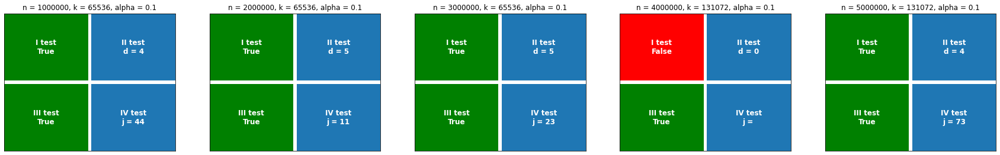

In [ ]:
#@title
sampleParams = [[1000000, 2**16, 0.1],
                  [2000000, 2**16, 0.1],
                  [3000000, 2**16, 0.1],
                  [4000000, 2**17, 0.1],
                  [5000000, 2**17, 0.1]]
javaRes = getTestResultsForFiveSample(sampleParams, "/content/drive/MyDrive/Colab Notebooks/random generator tests/javaRands")
showTestResults(javaRes, sampleParams)

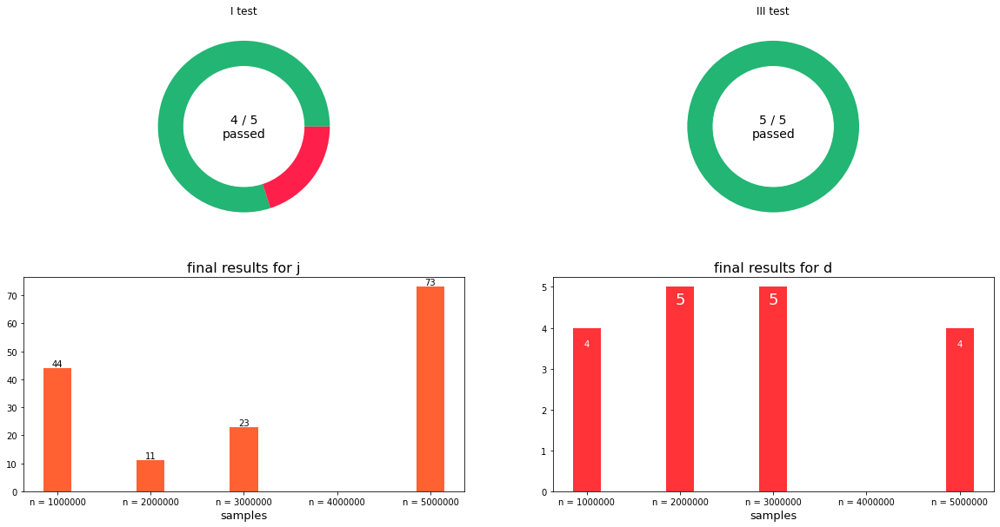

In [ ]:
#@title
showOverallResults(javaRes, sampleParams)

#testing **c#** built-in random generator

####sample visualization

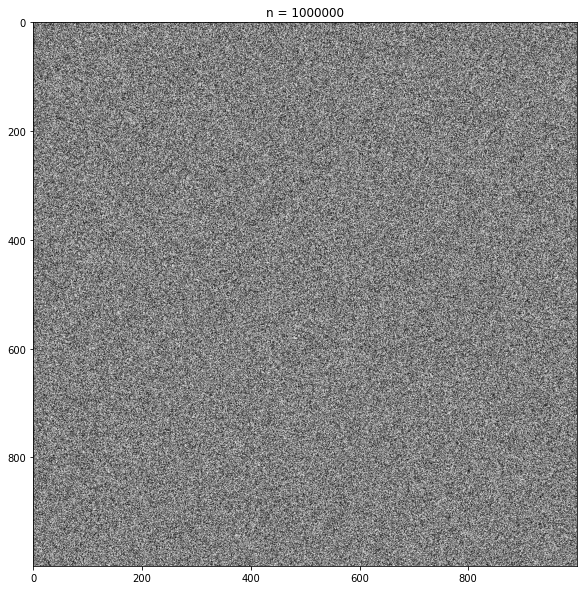

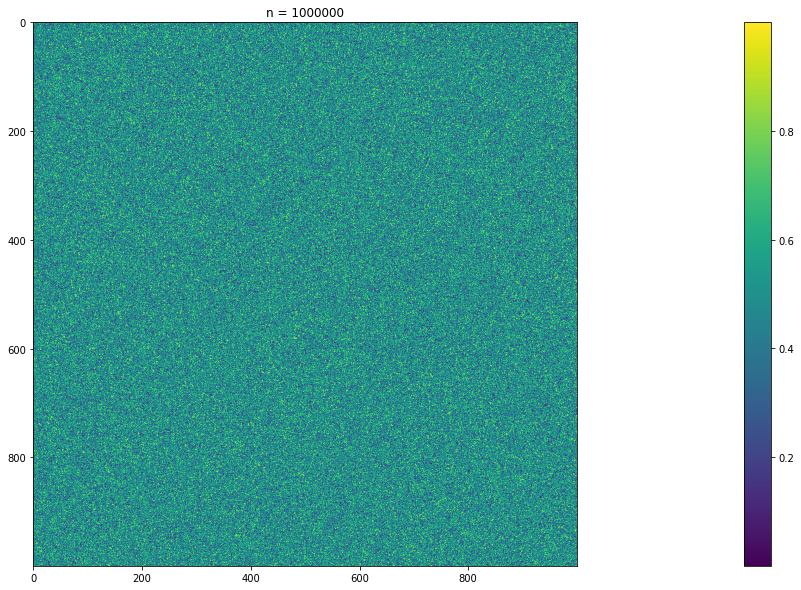

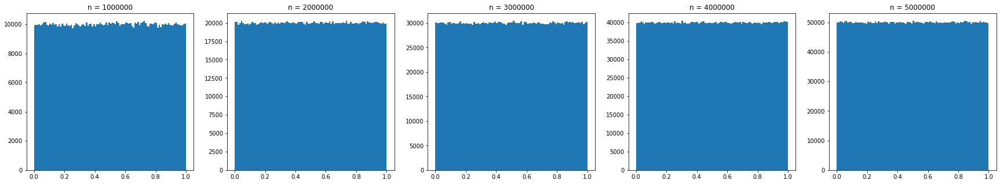

In [ ]:
#@title
showDroppedSpines("/content/drive/MyDrive/Colab Notebooks/random generator tests/csRands")
showColorbars("/content/drive/MyDrive/Colab Notebooks/random generator tests/csRands")
showHistograms("/content/drive/MyDrive/Colab Notebooks/random generator tests/csRands")

####testing results

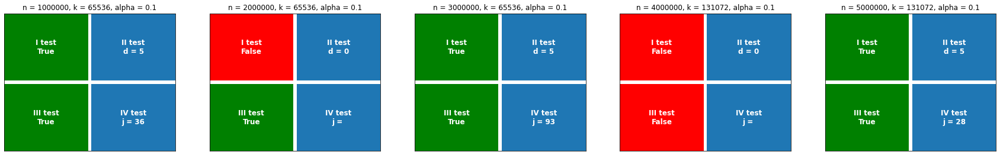

In [ ]:
#@title
sampleParams = [[1000000, 2**16, 0.1],
                  [2000000, 2**16, 0.1],
                  [3000000, 2**16, 0.1],
                  [4000000, 2**17, 0.1],
                  [5000000, 2**17, 0.1]]
csRes = getTestResultsForFiveSample(sampleParams, "/content/drive/MyDrive/Colab Notebooks/random generator tests/csRands")
showTestResults(csRes, sampleParams)

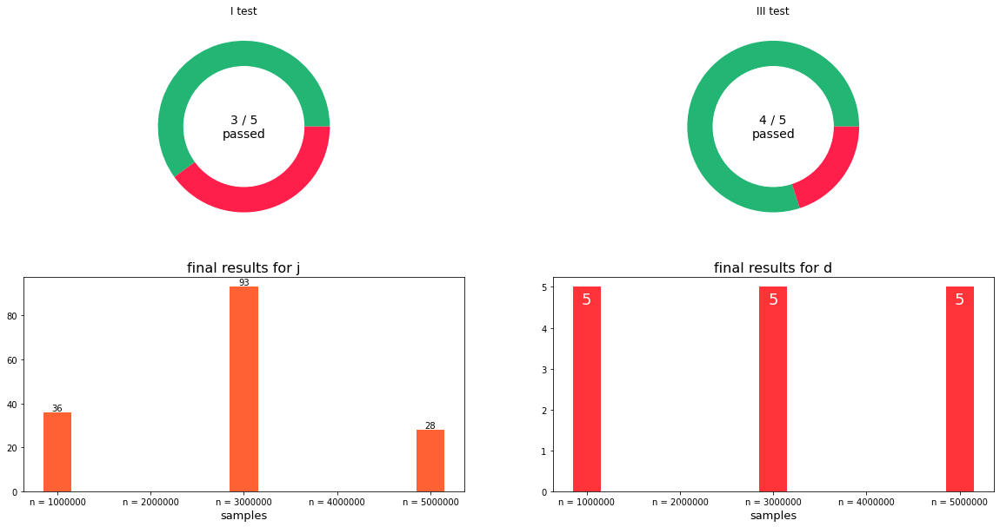

In [ ]:
#@title
showOverallResults(csRes, sampleParams)

#testing **javascript** built-in random generator

####sample visualization

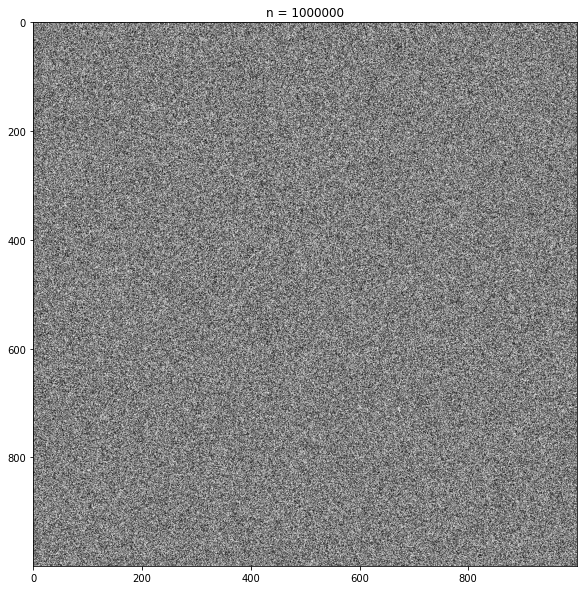

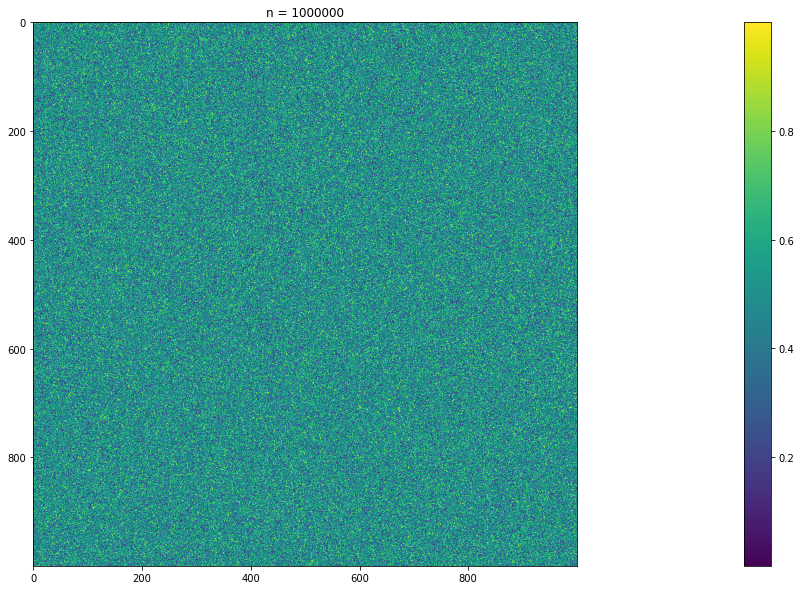

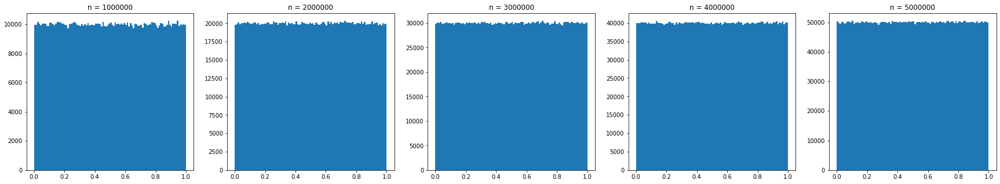

In [ ]:
#@title
showDroppedSpines("/content/drive/MyDrive/Colab Notebooks/random generator tests/jsRands")
showColorbars("/content/drive/MyDrive/Colab Notebooks/random generator tests/jsRands")
showHistograms("/content/drive/MyDrive/Colab Notebooks/random generator tests/jsRands")

####testing results

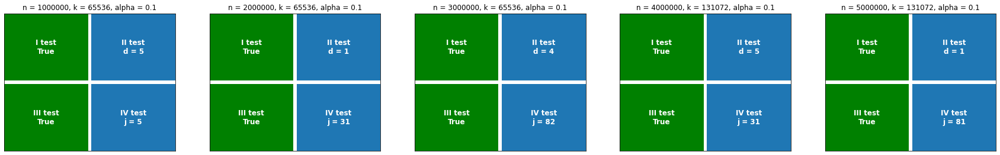

In [ ]:
#@title
sampleParams = [[1000000, 2**16, 0.1],
                  [2000000, 2**16, 0.1],
                  [3000000, 2**16, 0.1],
                  [4000000, 2**17, 0.1],
                  [5000000, 2**17, 0.1]]
jsRes = getTestResultsForFiveSample(sampleParams, "/content/drive/MyDrive/Colab Notebooks/random generator tests/jsRands")
showTestResults(jsRes, sampleParams)

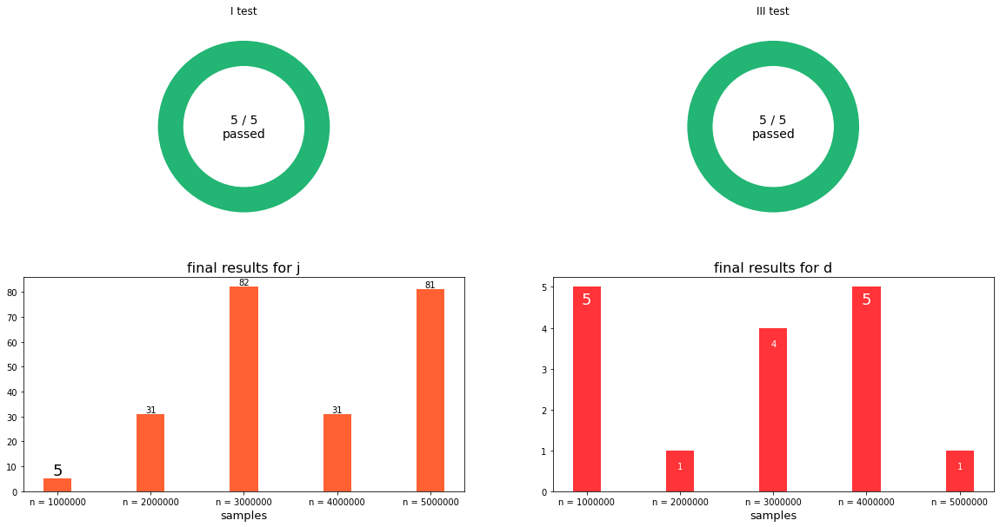

In [ ]:
#@title
showOverallResults(jsRes, sampleParams)

#testing **Go** built-in random generator

####sample visualization

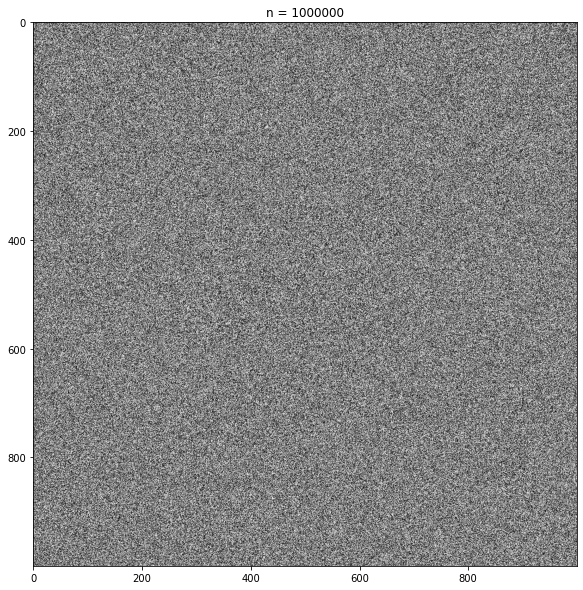

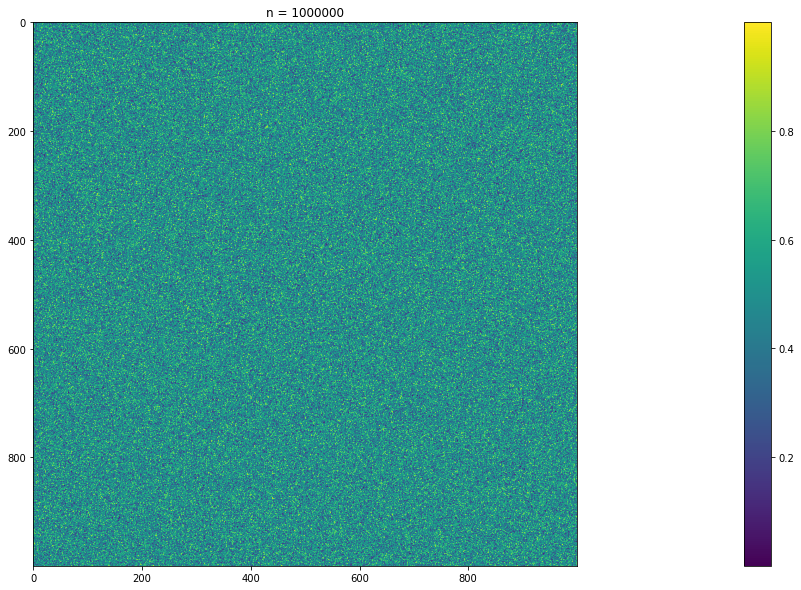

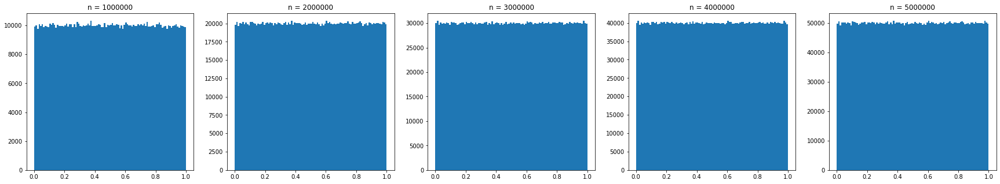

In [ ]:
#@title
showDroppedSpines("/content/drive/MyDrive/Colab Notebooks/random generator tests/goRands")
showColorbars("/content/drive/MyDrive/Colab Notebooks/random generator tests/goRands")
showHistograms("/content/drive/MyDrive/Colab Notebooks/random generator tests/goRands")

####testing results

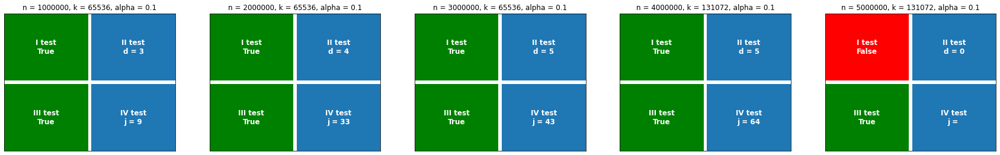

In [ ]:
#@title
sampleParams = [[1000000, 2**16, 0.1],
                  [2000000, 2**16, 0.1],
                  [3000000, 2**16, 0.1],
                  [4000000, 2**17, 0.1],
                  [5000000, 2**17, 0.1]]
goRes = getTestResultsForFiveSample(sampleParams, "/content/drive/MyDrive/Colab Notebooks/random generator tests/goRands")
showTestResults(goRes, sampleParams)

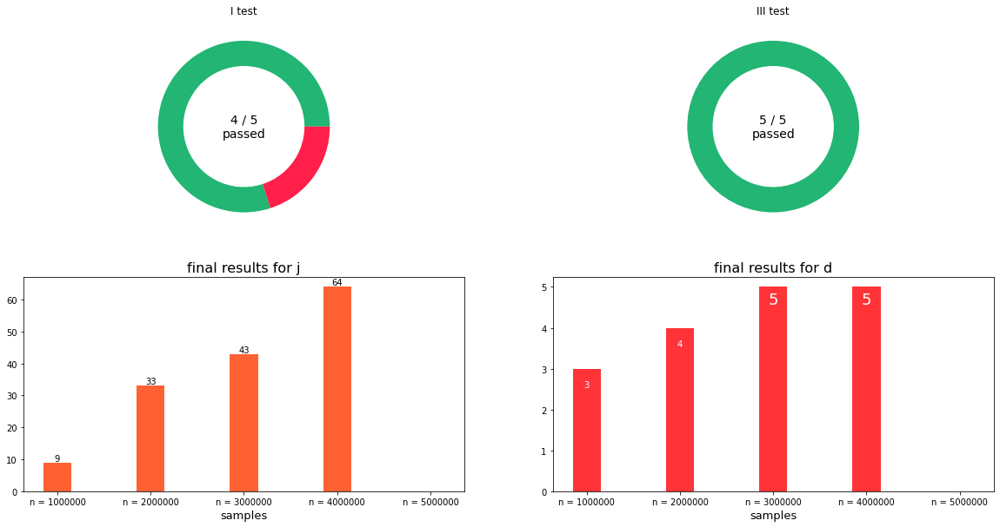

In [ ]:
#@title
showOverallResults(goRes, sampleParams)

#testing **PHP** built-in random generator

####sample visualization

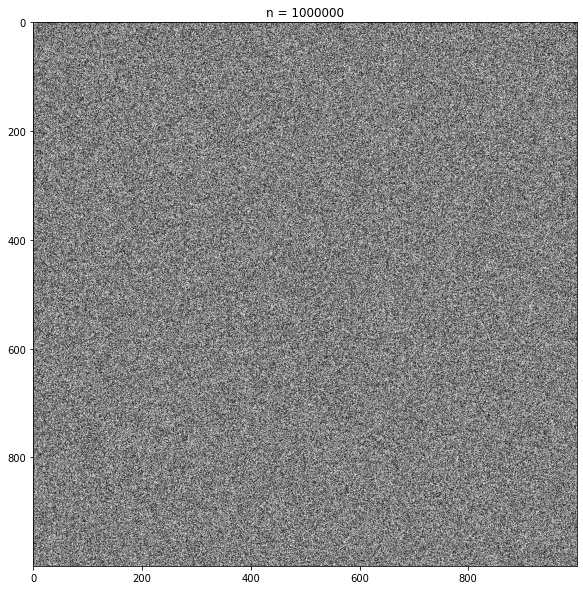

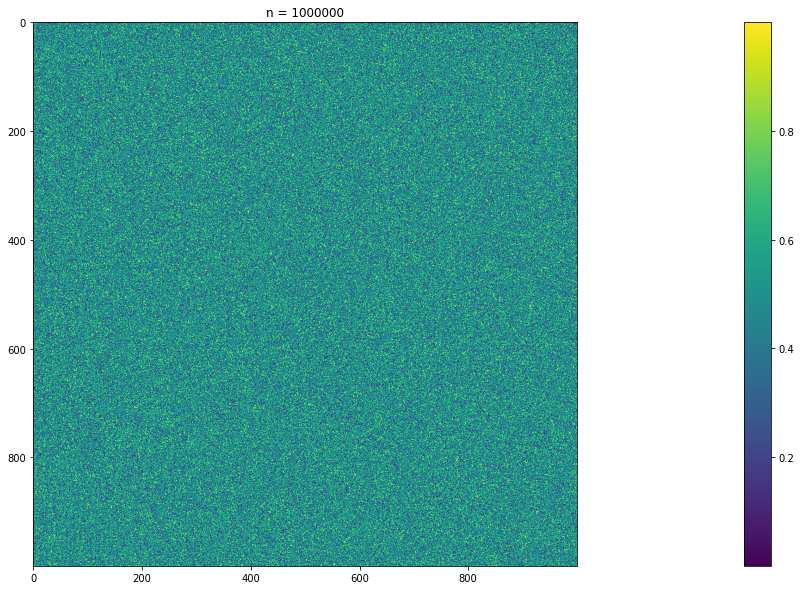

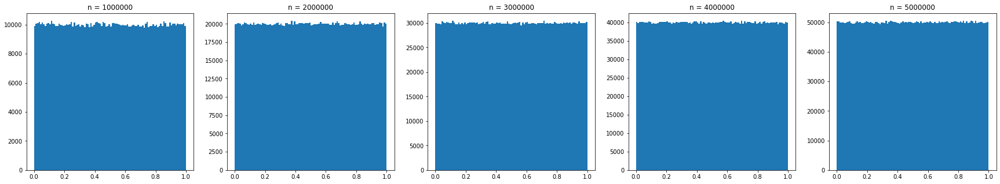

In [ ]:
#@title
showDroppedSpines("/content/drive/MyDrive/Colab Notebooks/random generator tests/phpRands")
showColorbars("/content/drive/MyDrive/Colab Notebooks/random generator tests/phpRands")
showHistograms("/content/drive/MyDrive/Colab Notebooks/random generator tests/phpRands")

####testing results

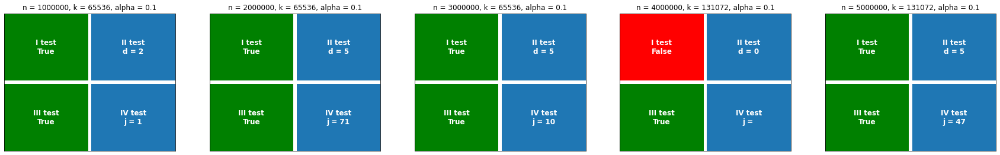

In [ ]:
#@title
sampleParams = [[1000000, 2**16, 0.1],
                  [2000000, 2**16, 0.1],
                  [3000000, 2**16, 0.1],
                  [4000000, 2**17, 0.1],
                  [5000000, 2**17, 0.1]]
phpRes = getTestResultsForFiveSample(sampleParams, "/content/drive/MyDrive/Colab Notebooks/random generator tests/phpRands")
showTestResults(phpRes, sampleParams)

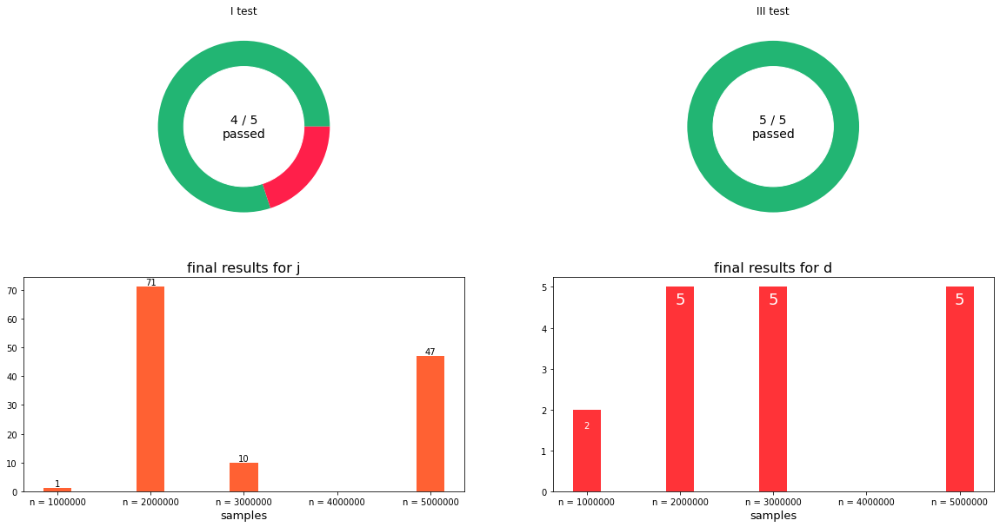

In [ ]:
#@title
showOverallResults(phpRes, sampleParams)

#final results for all languages

###mtrcs

In [ ]:
# pyRes = [
#     [True, 1, False, 1],
#     [True, 5, True, 12],
#     [True, 5, True, 10],
#     [True, 1, False, 7],
#     [False, 1, True, 47]
# ]
# cppRes = [
#     [True, 5, True, 21],
#     [True, 4, True, 5],
#     [True, 1, True, 7],
#     [True, 5, True, 47],
#     [True, 5, True, 34]
# ]
# javaRes = [
#     [True, 4, True, 44],
#     [True, 5, True, 11],
#     [True, 5, True, 23],
#     [True, 2, True, 17],
#     [True, 4, True, 73]
# ]
# csRes = [
#     [True, 5, True, 36],
#     [True, 5, True, 12],
#     [True, 5, True, 93],
#     [True, 5, False, 20],
#     [False, 5, True, 28]
# ]
# jsRes = [
#     [True, 5, True, 5],
#     [True, 1, True, 31],
#     [True, 4, True, 82],
#     [True, 5, True, 31],
#     [False, 0, True, 81]
# ]
# goRes = [
#     [True, 3, True, 9],
#     [True, 4, True, 33],
#     [True, 5, True, 43],
#     [True, 5, True, 64],
#     [False, 0, True, 4]
# ]
# phpRes = [
#     [True, 2, True, 1],
#     [True, 5, True, 71],
#     [True, 1, True, 10],
#     [True, 1, True, 22],
#     [True, 0, True, 47]
# ]

###To sum up

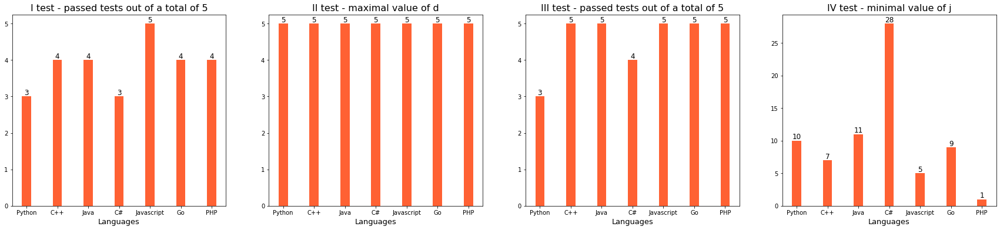

In [ ]:
#@title
finalResults = {
    tpl[0] : [sum([int(arr[0]) for arr in tpl[1]]), max([arr[1] for arr in tpl[1]]), sum([int(arr[2]) for arr in tpl[1]]), min([int(arr[3]) for arr in tpl[1]])]
    for tpl in [("Python", pyRes), ("C++", cppRes), ("Java", javaRes), ("C#", csRes), ("Javascript", jsRes), ("Go", goRes), ("PHP", phpRes)]
}
minjs = [10, 7, 11, 28, 5, 9, 1]
jj = 0
for key in finalResults.keys():
  finalResults[key][3] = minjs[jj]
  jj +=1

fig, ax = plt.subplots(1, 4, figsize = (30, 6))

ticks = finalResults.keys()
titles = ["I test - passed tests out of a total of 5", "II test - maximal value of d", "III test - passed tests out of a total of 5", "IV test - minimal value of j"]

wd = 0.6
x_pos = np.arange(1, 2*len(ticks), 2, )

for i in range(4):
  data = [finalResults[k][i] for k in finalResults.keys()]
  ax[i].bar(x_pos, data, color='#FF6133', width=wd)
  for j in range(len(ticks)):
    ax[i].text(x_pos[j], data[j] , str(data[j]), ha='center', va='bottom', fontsize=12)
  ax[i].set_xticks(x_pos)
  ax[i].set_xticklabels(ticks)
  ax[i].set_title(titles[i], fontsize=16)
  ax[i].set_xlabel('Languages', fontsize=13)

plt.show()